In [3]:
from pathlib import Path

from adain_model import AdaINModel, AdaINLoss
from adain_datamodule import AdaINDataModule
from adain_trainer import AdaINTrainer

import os
os.environ["KERAS_BACKEND"] = "torch"
import keras
import torch

In [ ]:
run_id = '043322d236474564bbe38e9861771a91'
train_epochs = 7
start_epoch = 0
dataset_size = 100000
lr = 1e-4
decay_rate = 1e-5
decay_steps = 10
style_loss_weight = 5
tv_weight = 1
additional_tags = {'Upsampling' : 'PixelShuffle'}

In [ ]:
dm = AdaINDataModule(Path("D:/StyleTransferAI/StyleTransferAI_AdaIN/datasets/unlabeled2017/"), Path("D:/StyleTransferAI/StyleTransferAI_AdaIN/datasets/WikiArt/"), dataset_size=dataset_size, seed=444, batch_size=8)
# model = AdaINModel.load_from_mlflow(run_id, Path("D:/Python/ML Flow/mlruns"))
model = AdaINModel()
model.compile(optimizer='adam')
model.optimizer.learning_rate = keras.optimizers.schedules.InverseTimeDecay(initial_learning_rate=lr, decay_steps=decay_steps, decay_rate=decay_rate)
model.loss_ = AdaINLoss(style_loss_weight=style_loss_weight, tv_weight=tv_weight)

d:\Python\StyleTransferAI\Lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 38 variables whereas the saved optimizer has 37 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [6]:
total_epochs = start_epoch + train_epochs
trainer = AdaINTrainer(model, dm, 'adam', mlflow_dir=Path("D:/Python/ML Flow/mlruns"), mlflow_tags={"Dataset size" : dataset_size, "Real training" : True, "Total epochs" : f'{total_epochs} ({10*total_epochs} Keras epochs)', "Start epoch" : start_epoch, **additional_tags})
trainer.train(epochs=10*train_epochs, steps_per_epoch=1000, log_every_n_epochs=10, validation_steps=200, test_steps=200)

Initiating datasets...
Compiling the model...
Model is ready to be trained
Training the model...


Epoch 1/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 541s 541ms/step - loss: 215107.7656 - val_loss: 210355.1562
Epoch 2/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 549s 549ms/step - loss: 213471.4062 - val_loss: 210720.3438
Epoch 3/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 547s 547ms/step - loss: 211382.7031 - val_loss: 213590.9062
Epoch 4/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 547s 547ms/step - loss: 210717.8906 - val_loss: 210890.8750
Epoch 5/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 546s 546ms/step - loss: 211387.2500 - val_loss: 211593.9062
Epoch 6/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 211907.2656 - val_loss: 209214.2344
Epoch 7/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 551s 551ms/step - loss: 209488.3125 - val_loss: 211768.6250
Epoch 8/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 549s 549ms/step - loss: 210210.5781 - val_loss: 210292.9531
Epoch 9/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 549s 549ms/step - loss: 210233.4375 - val_loss: 206657.0781
Epoch 10/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 209437.5469 - v

Epoch 11/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 207867.3906 - val_loss: 209670.8594
Epoch 12/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 207391.5312 - val_loss: 207807.8438
Epoch 13/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 211373.9531 - val_loss: 207132.3750
Epoch 14/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 546s 546ms/step - loss: 208013.5625 - val_loss: 211367.4844
Epoch 15/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 209433.6094 - val_loss: 206750.4531
Epoch 16/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 208202.1719 - val_loss: 206486.7344
Epoch 17/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 547s 547ms/step - loss: 209235.2812 - val_loss: 210250.0938
Epoch 18/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 546s 546ms/step - loss: 206730.5938 - val_loss: 207779.8750
Epoch 19/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 207716.7812 - val_loss: 206413.7188
Epoch 20/20
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 546s 546ms/step - loss: 207070

Epoch 21/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 205674.0312 - val_loss: 208903.0469
Epoch 22/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 208092.8438 - val_loss: 206786.0156
Epoch 23/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 205191.8281 - val_loss: 204665.0000
Epoch 24/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 208575.8750 - val_loss: 205186.5938
Epoch 25/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 207570.1562 - val_loss: 205984.3125
Epoch 26/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 206816.1250 - val_loss: 206588.7656
Epoch 27/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 205869.3125 - val_loss: 207488.2188
Epoch 28/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 546ms/step - loss: 204281.0625 - val_loss: 207725.8125
Epoch 29/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 546s 546ms/step - loss: 205389.9219 - val_loss: 204188.2812
Epoch 30/30
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 206668

Epoch 31/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 204736.0156 - val_loss: 202466.9531
Epoch 32/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 205269.0156 - val_loss: 205882.0938
Epoch 33/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 204080.3438 - val_loss: 204074.5625
Epoch 34/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 204079.7344 - val_loss: 203502.8125
Epoch 35/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 546s 546ms/step - loss: 204797.9688 - val_loss: 205249.2188
Epoch 36/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 546s 546ms/step - loss: 203268.8281 - val_loss: 203519.1562
Epoch 37/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 205685.5000 - val_loss: 206496.3750
Epoch 38/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 205709.2188 - val_loss: 203725.0938
Epoch 39/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 204540.5625 - val_loss: 202420.1406
Epoch 40/40
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 202746

Epoch 41/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 545ms/step - loss: 202946.3438 - val_loss: 204608.6406
Epoch 42/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 546s 546ms/step - loss: 204413.3438 - val_loss: 205543.4062
Epoch 43/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 546s 546ms/step - loss: 204016.9844 - val_loss: 203952.3594
Epoch 44/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 203272.6250 - val_loss: 203899.4844
Epoch 45/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 547s 547ms/step - loss: 205225.5625 - val_loss: 201907.9531
Epoch 46/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 550s 550ms/step - loss: 202097.9219 - val_loss: 202523.9375
Epoch 47/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 204202.3594 - val_loss: 206697.5000
Epoch 48/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 202749.4062 - val_loss: 202873.7812
Epoch 49/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 549ms/step - loss: 202312.5312 - val_loss: 201891.1406
Epoch 50/50
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 203428

Epoch 51/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 201984.3281 - val_loss: 204743.6875
Epoch 52/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 203431.4375 - val_loss: 205100.5625
Epoch 53/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 542s 542ms/step - loss: 203445.7031 - val_loss: 203481.0156
Epoch 54/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 546s 546ms/step - loss: 201810.8438 - val_loss: 201862.0938
Epoch 55/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 547s 548ms/step - loss: 200994.0938 - val_loss: 200123.3125
Epoch 56/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 549s 549ms/step - loss: 200954.2188 - val_loss: 202648.3125
Epoch 57/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 546ms/step - loss: 203301.6250 - val_loss: 205578.5938
Epoch 58/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 201046.0469 - val_loss: 201845.7188
Epoch 59/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 548s 548ms/step - loss: 203345.8750 - val_loss: 200890.7812
Epoch 60/60
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 546s 546ms/step - loss: 202785

Epoch 61/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 202126.8125 - val_loss: 202757.4219
Epoch 62/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 200798.0938 - val_loss: 203807.9375
Epoch 63/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 201599.6094 - val_loss: 203031.5469
Epoch 64/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 542s 543ms/step - loss: 203202.6250 - val_loss: 202496.7188
Epoch 65/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 201906.4688 - val_loss: 203000.1562
Epoch 66/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 543s 543ms/step - loss: 204247.6406 - val_loss: 202131.9531
Epoch 67/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 546s 546ms/step - loss: 202313.0625 - val_loss: 201540.4062
Epoch 68/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 202250.2500 - val_loss: 203698.0000
Epoch 69/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 201509.5625 - val_loss: 203243.2969
Epoch 70/70
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 544s 544ms/step - loss: 201813

Epoch 71/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 546s 546ms/step - loss: 202428.5000 - val_loss: 202697.2812
Epoch 72/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 542s 542ms/step - loss: 201075.0938 - val_loss: 199687.4531
Epoch 73/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 542s 542ms/step - loss: 201151.5312 - val_loss: 200780.4844
Epoch 74/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 542s 542ms/step - loss: 202490.5312 - val_loss: 201525.0781
Epoch 75/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 542s 542ms/step - loss: 199380.1562 - val_loss: 201125.9844
Epoch 76/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 541s 541ms/step - loss: 202321.9375 - val_loss: 200379.2656
Epoch 77/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 539s 539ms/step - loss: 200564.3750 - val_loss: 200436.4844
Epoch 78/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 532s 532ms/step - loss: 203381.3281 - val_loss: 199770.2031
Epoch 79/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 534s 534ms/step - loss: 200684.2188 - val_loss: 203660.9219
Epoch 80/80
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 536s 536ms/step - loss: 201595

Epoch 81/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 535s 535ms/step - loss: 202084.9531 - val_loss: 202803.4531
Epoch 82/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 534s 534ms/step - loss: 201624.5938 - val_loss: 203275.0000
Epoch 83/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 537s 537ms/step - loss: 201555.0000 - val_loss: 200062.5781
Epoch 84/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 537s 537ms/step - loss: 200061.4219 - val_loss: 200818.9375
Epoch 85/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 541s 541ms/step - loss: 201932.6875 - val_loss: 200707.9531
Epoch 86/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 541s 541ms/step - loss: 200047.1250 - val_loss: 203179.5469
Epoch 87/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 541s 541ms/step - loss: 200309.3281 - val_loss: 201521.2188
Epoch 88/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 538s 538ms/step - loss: 200045.1406 - val_loss: 199906.5156
Epoch 89/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 540s 540ms/step - loss: 202254.1406 - val_loss: 201545.8594
Epoch 90/90
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 540s 540ms/step - loss: 199490

Epoch 91/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 534s 534ms/step - loss: 201254.0938 - val_loss: 200524.9062
Epoch 92/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 533s 533ms/step - loss: 200406.3281 - val_loss: 199486.8594
Epoch 93/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 535s 535ms/step - loss: 203271.8906 - val_loss: 202324.6406
Epoch 94/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 536s 536ms/step - loss: 199539.6094 - val_loss: 201244.0469
Epoch 95/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 535s 535ms/step - loss: 200786.1875 - val_loss: 200937.0156
Epoch 96/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 536s 536ms/step - loss: 201562.9062 - val_loss: 202790.9062
Epoch 97/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 537s 537ms/step - loss: 201509.3750 - val_loss: 200135.2969
Epoch 98/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 537s 537ms/step - loss: 199747.0938 - val_loss: 200202.7188
Epoch 99/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 537s 537ms/step - loss: 198584.1719 - val_loss: 200721.2188
Epoch 100/100
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 539s 539ms/step - l

Epoch 101/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 534s 534ms/step - loss: 201433.1875 - val_loss: 199460.6562
Epoch 102/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 536s 536ms/step - loss: 200468.3438 - val_loss: 200081.9375
Epoch 103/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 536s 536ms/step - loss: 199648.6875 - val_loss: 201758.4219
Epoch 104/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 535s 535ms/step - loss: 200991.8594 - val_loss: 200850.9531
Epoch 105/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 537s 537ms/step - loss: 202662.2031 - val_loss: 198400.2031
Epoch 106/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 534s 534ms/step - loss: 200777.7969 - val_loss: 200678.9844
Epoch 107/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 537s 537ms/step - loss: 200231.5156 - val_loss: 198063.4375
Epoch 108/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 535s 535ms/step - loss: 199450.3281 - val_loss: 200932.4844
Epoch 109/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 535s 535ms/step - loss: 198779.5312 - val_loss: 199199.2812
Epoch 110/110
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 538s 538ms

Epoch 111/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 537s 537ms/step - loss: 198846.2812 - val_loss: 202421.5469
Epoch 112/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 535s 535ms/step - loss: 199930.2656 - val_loss: 198595.5625
Epoch 113/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 537s 537ms/step - loss: 199215.5000 - val_loss: 196846.0938
Epoch 114/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 537s 537ms/step - loss: 199995.3906 - val_loss: 200822.6875
Epoch 115/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 535s 535ms/step - loss: 200817.5000 - val_loss: 200898.0781
Epoch 116/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 539s 539ms/step - loss: 200090.2500 - val_loss: 199322.5938
Epoch 117/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 538s 538ms/step - loss: 198543.1875 - val_loss: 199713.4844
Epoch 118/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 538s 538ms/step - loss: 198829.9531 - val_loss: 199020.5000
Epoch 119/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 537s 537ms/step - loss: 201248.1406 - val_loss: 199705.4844
Epoch 120/120
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 536s 536ms

Epoch 121/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 535s 535ms/step - loss: 200155.6719 - val_loss: 199698.7031
Epoch 122/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 539s 539ms/step - loss: 198492.4375 - val_loss: 199090.5625
Epoch 123/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 539s 539ms/step - loss: 200981.8750 - val_loss: 198181.8594
Epoch 124/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 540s 540ms/step - loss: 200021.8125 - val_loss: 200225.0625
Epoch 125/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 540s 540ms/step - loss: 199684.0781 - val_loss: 200048.2188
Epoch 126/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 538s 538ms/step - loss: 199661.6406 - val_loss: 199360.9219
Epoch 127/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 541s 541ms/step - loss: 198650.7969 - val_loss: 200407.2812
Epoch 128/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 540s 540ms/step - loss: 198007.6094 - val_loss: 198756.7969
Epoch 129/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 541s 541ms/step - loss: 200474.7656 - val_loss: 197911.3594
Epoch 130/130
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 540s 540ms

Epoch 131/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 534s 534ms/step - loss: 198274.7188 - val_loss: 198109.1875
Epoch 132/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 539s 539ms/step - loss: 200472.3438 - val_loss: 198067.9219
Epoch 133/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 539s 539ms/step - loss: 199275.2500 - val_loss: 197631.3438
Epoch 134/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 537s 537ms/step - loss: 198882.5000 - val_loss: 199626.1250
Epoch 135/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 539s 539ms/step - loss: 199927.2188 - val_loss: 199311.0156
Epoch 136/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 538s 539ms/step - loss: 199387.7656 - val_loss: 202516.5469
Epoch 137/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 540s 540ms/step - loss: 200525.7344 - val_loss: 200053.7812
Epoch 138/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 541s 541ms/step - loss: 200643.8906 - val_loss: 199126.2344
Epoch 139/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 541s 541ms/step - loss: 199186.3750 - val_loss: 201194.9062
Epoch 140/140
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 540s 540ms

Epoch 141/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 536s 536ms/step - loss: 198887.4062 - val_loss: 198428.0156
Epoch 142/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 538s 538ms/step - loss: 199073.5156 - val_loss: 197376.1250
Epoch 143/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 536s 536ms/step - loss: 199310.7656 - val_loss: 198194.8750
Epoch 144/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 581s 581ms/step - loss: 198088.9531 - val_loss: 200596.4219
Epoch 145/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 579s 579ms/step - loss: 198444.2656 - val_loss: 200058.2656
Epoch 146/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 604s 604ms/step - loss: 199785.9688 - val_loss: 201767.0000
Epoch 147/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 604s 604ms/step - loss: 201052.3438 - val_loss: 197190.1562
Epoch 148/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 5154s 5s/step - loss: 199271.4531 - val_loss: 198493.6406
Epoch 149/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 1590s 2s/step - loss: 198996.8125 - val_loss: 201126.9062
Epoch 150/150
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 620s 620ms/ste

In [9]:
imgs = []
torch.random.manual_seed(444)
for i, ((content, style), _) in enumerate(dm._train_dataset) :
    if i == 20 :
        break
    gen_img = model.generate(content, style)
    imgs.append([content.type(torch.int), style.type(torch.int), gen_img])

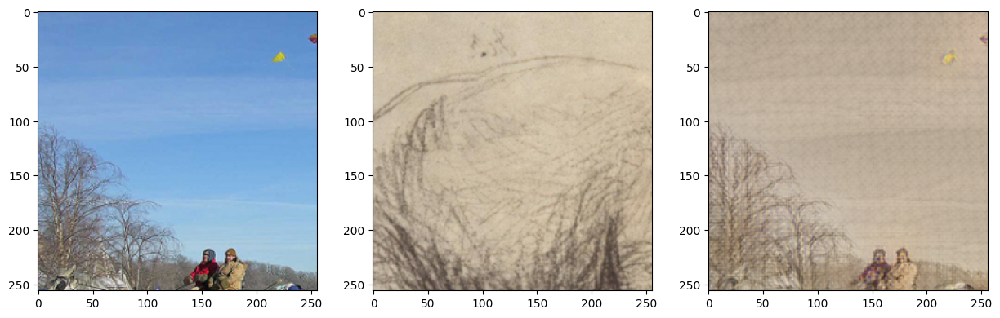

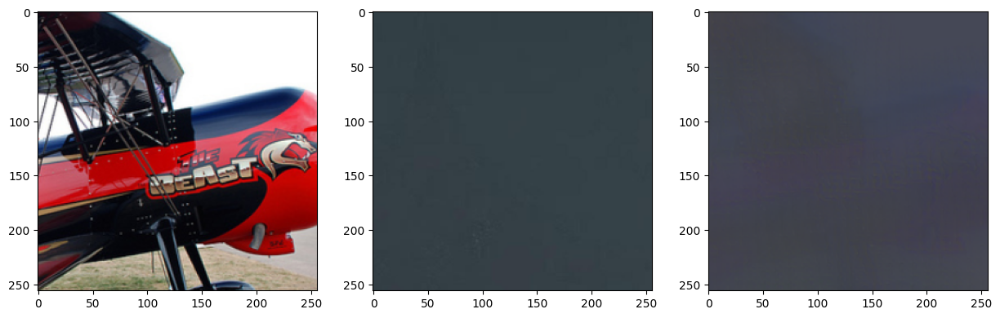

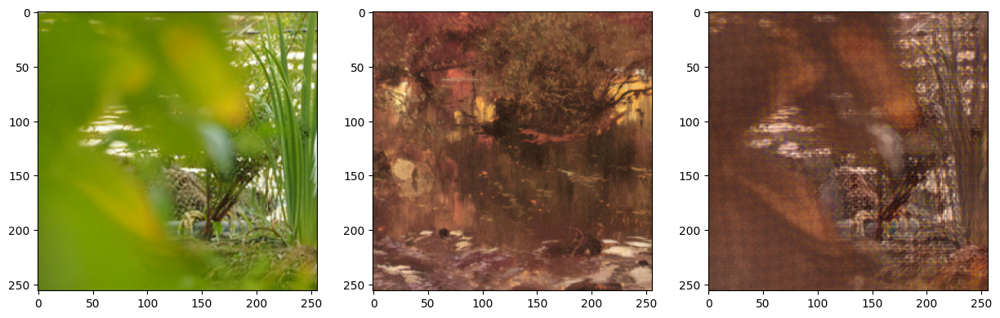

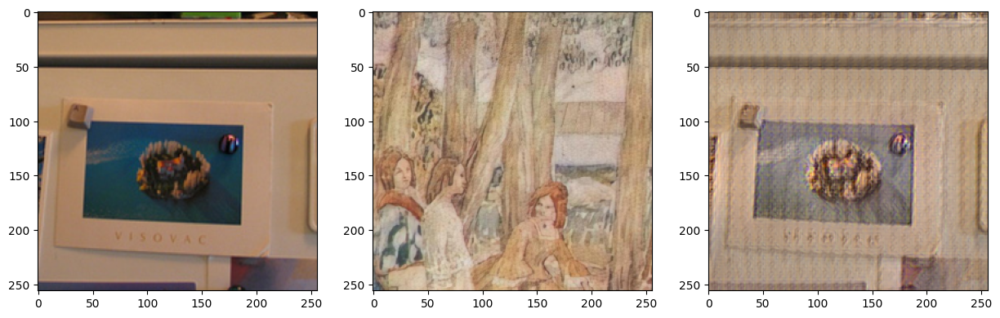

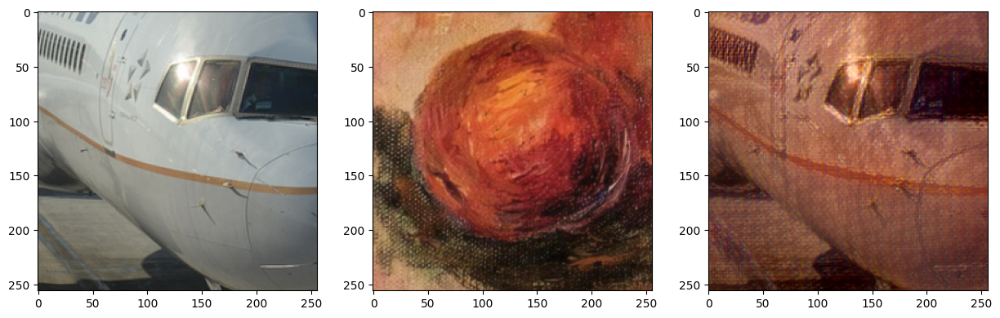

...

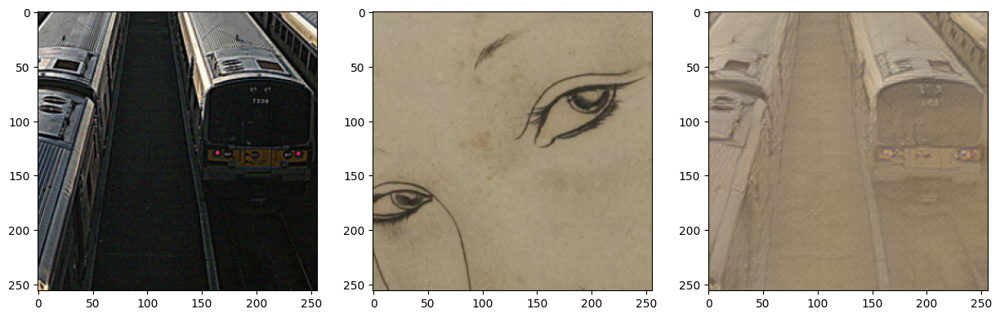

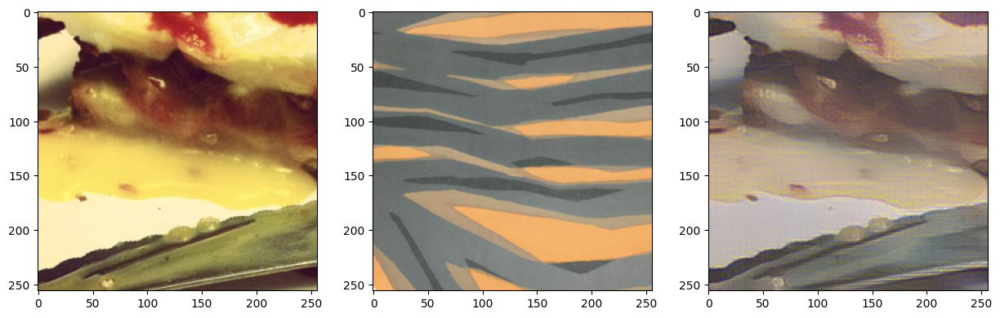

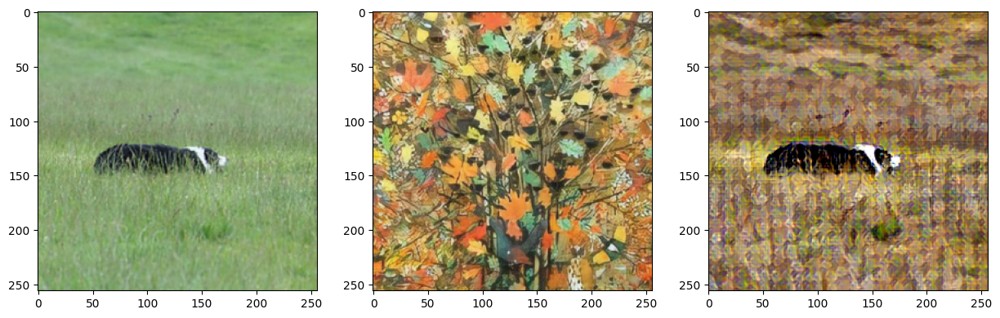

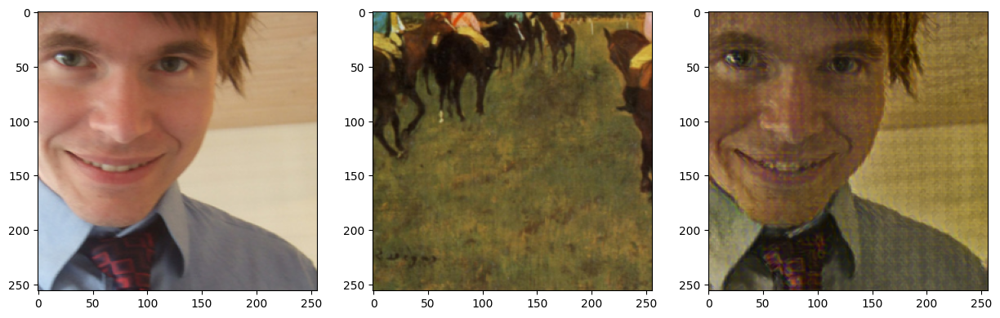

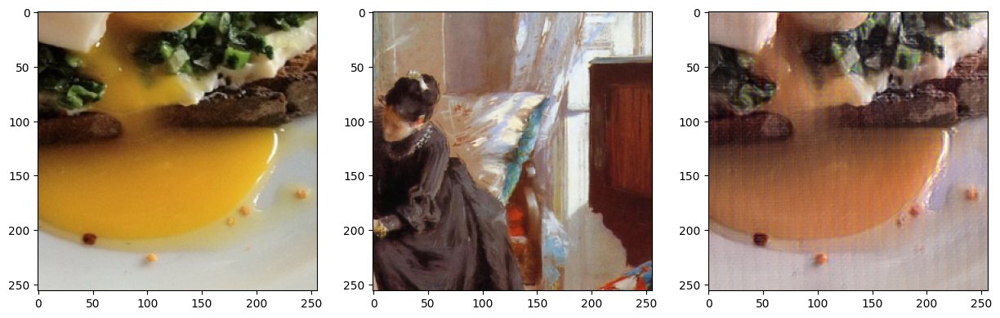

In [10]:
import matplotlib.pyplot as plt

for gen in imgs :
    fig, axs = plt.subplots(1,3, figsize=(15,5))
    for i in range(3) :
        axs[i].imshow(gen[i])
    plt.show()